In [101]:
import pandas as pd
from bifacial_peak_shaving import *
from utils import *
pd.options.plotting.backend='plotly'

# Data

In [102]:
dir = './Data/'

## Load

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 2022-01-01 00:00:00 to 2022-12-31 23:00:00
Freq: H
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Load (kW)  8760 non-null   float64
dtypes: float64(1)
memory usage: 136.9 KB
None
                     Load (kW)
2022-01-01 00:00:00     0.0000
2022-01-01 01:00:00     0.0000
2022-01-01 02:00:00     0.0000
2022-01-01 03:00:00     0.0000
2022-01-01 04:00:00     0.0000
...                        ...
2022-12-31 19:00:00     0.0775
2022-12-31 20:00:00     0.1700
2022-12-31 21:00:00     0.3125
2022-12-31 22:00:00     0.3925
2022-12-31 23:00:00     0.2200

[8760 rows x 1 columns]


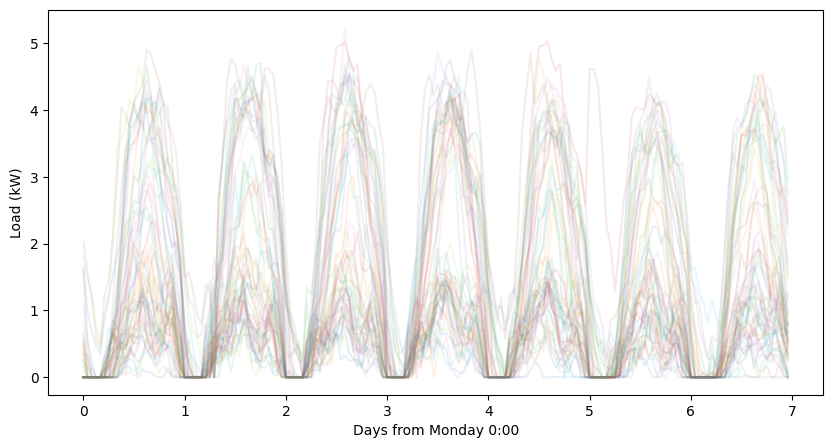

In [103]:
load = pd.read_csv( dir+'verizon_west_excelsior_profile_load_solarTMY_TS2.csv',
                    comment='#',
                    index_col=0,
                    parse_dates=True,
                    usecols=[0,1])
load = load.resample('1h').mean()
load.columns = ['Load (kW)']
load.loc['2022-3-13'] = load.loc['2022-3-12'].values
load.loc['2022-6-22'] = load.loc['2022-6-20'].values
load.loc['2022-6-23'] = load.loc['2022-6-21'].values
load.loc['2022-8-25'] = load.loc['2022-8-23'].values
load.loc['2022-8-26'] = load.loc['2022-8-24'].values

load = load - 4.5
load[load['Load (kW)']<0] = 0

print(load.info())
print(load)
plot_weekly(load['Load (kW)'],interval_min=60)

In [104]:
load.plot()

## Solar

- 7 kWp, TMY

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [105]:
solar_angles = ['s20','w20','w90','s20w90']
solar = pd.concat(( 
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_s20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w90deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_3.5kwp_s20deg_3.5kwp_w90deg.csv',index_col=0),
                   ),
                  axis=1)
solar.index = pd.date_range('1900-1-1 0:00',periods=8760,freq='1h')
solar.columns = solar_angles
net_zero_capacity = load['Load (kW)'].sum() / (solar.s20.sum()/7) # load=production / yield
solar = solar * net_zero_capacity/7 # scale to net 0
#solar = solar * 2 # randomly scale up
solar.describe()

,s20,w20,w90,s20w90
count,8760.000000,8760.000000,8760.000000,8760.000000
mean,1.096750,0.980424,1.048904,1.073717
std,1.548485,1.383768,1.378872,1.367441
min,-0.003816,-0.003816,-0.003477,-0.003191
25%,-0.000451,-0.000451,-0.000451,-0.000451
50%,-0.000451,-0.000451,-0.000451,-0.000451
75%,2.168580,1.922075,2.020192,2.314329
max,6.257549,6.028646,5.283181,4.861767


In [106]:
solar.loc['1900-8-25':'1900-8-27'].plot()

In [107]:
# for col in solar:
#     plot_daily(solar[col],title=col,interval_min=60)

## Plot weekly

In [108]:
solar.index = load.index
df = pd.concat((load,solar),axis=1)
df.columns = ['load'] + ['solar_'+x for x in solar.columns]
for angle in solar.columns:
    df[f'netload_{angle}'] = df['load'] - solar[angle]
df    

,load,solar_s20,solar_w20,solar_w90,solar_s20w90,netload_s20,netload_w20,netload_w90,netload_s20w90
2022-01-01 00:00:00,0.0000,-0.000451,-0.000451,-0.000451,-0.000451,0.000451,0.000451,0.000451,0.000451
2022-01-01 01:00:00,0.0000,-0.000451,-0.000451,-0.000451,-0.000451,0.000451,0.000451,0.000451,0.000451
2022-01-01 02:00:00,0.0000,-0.000451,-0.000451,-0.000451,-0.000451,0.000451,0.000451,0.000451,0.000451
2022-01-01 03:00:00,0.0000,-0.000451,-0.000451,-0.000451,-0.000451,0.000451,0.000451,0.000451,0.000451
2022-01-01 04:00:00,0.0000,-0.000451,-0.000451,-0.000451,-0.000451,0.000451,0.000451,0.000451,0.000451
...,...,...,...,...,...,...,...,...,...
2022-12-31 19:00:00,0.0775,-0.000451,-0.000451,-0.000451,-0.000451,0.077951,0.077951,0.077951,0.077951
2022-12-31 20:00:00,0.1700,-0.000451,-0.000451,-0.000451,-0.000451,0.170451,0.170451,0.170451,0.170451
2022-12-31 21:00:00,0.3125,-0.000451,-0.000451,-0.000451,-0.000451,0.312951,0.312951,0.312951,0.312951
2022-12-31 22:00:00,0.3925,-0.000451,-0.000451,-0.000451,-0.000451,0.392951,0.392951,0.392951,0.392951


load v s20

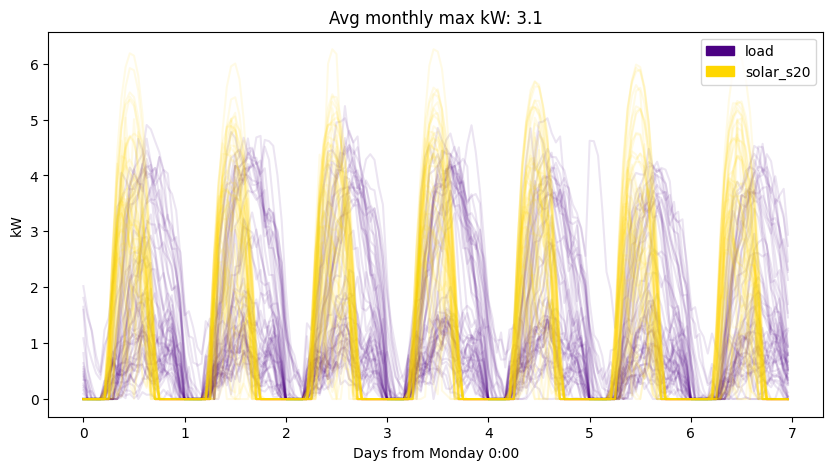

In [109]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

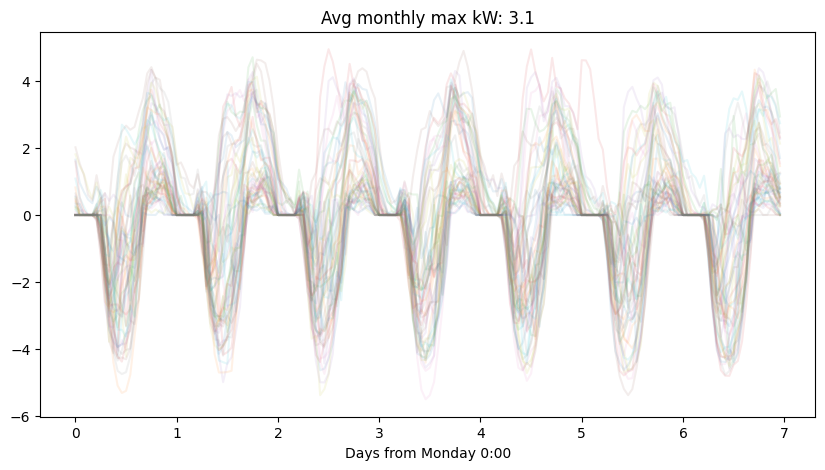

In [110]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w20

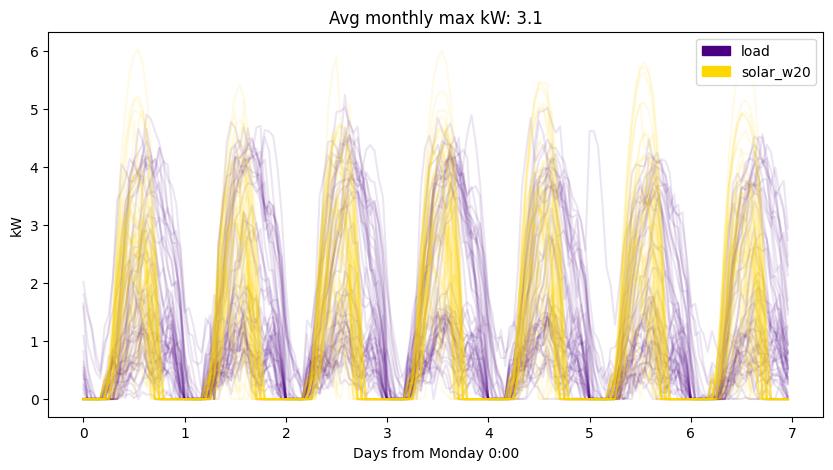

In [111]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

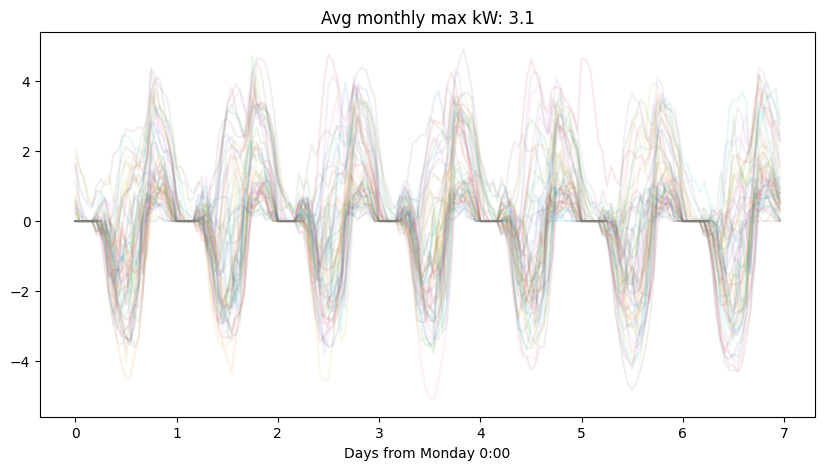

In [112]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

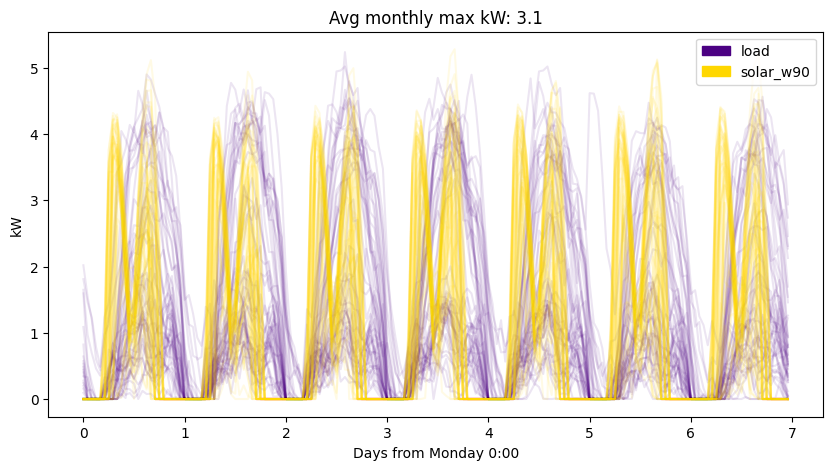

In [113]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

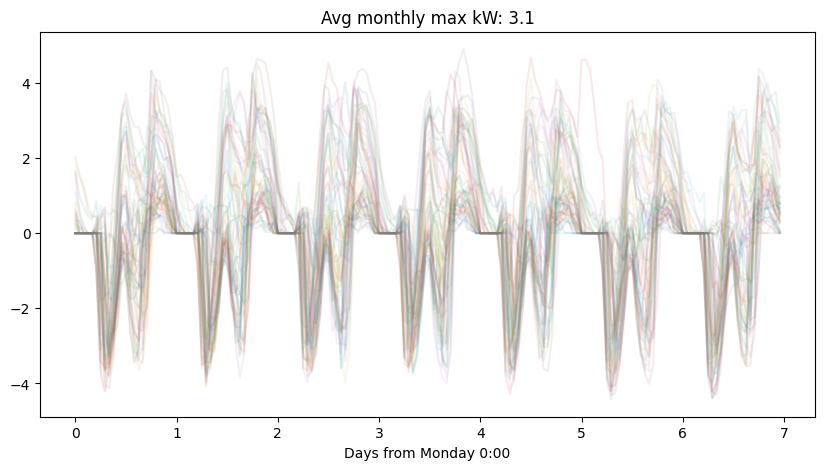

In [114]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90

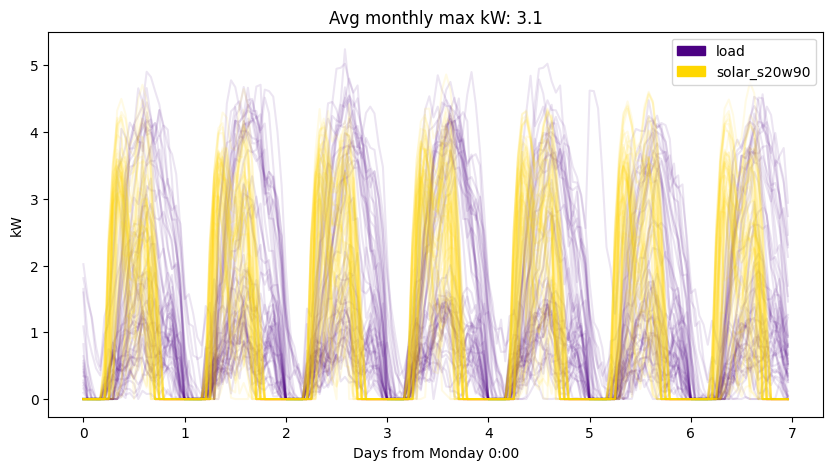

In [115]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

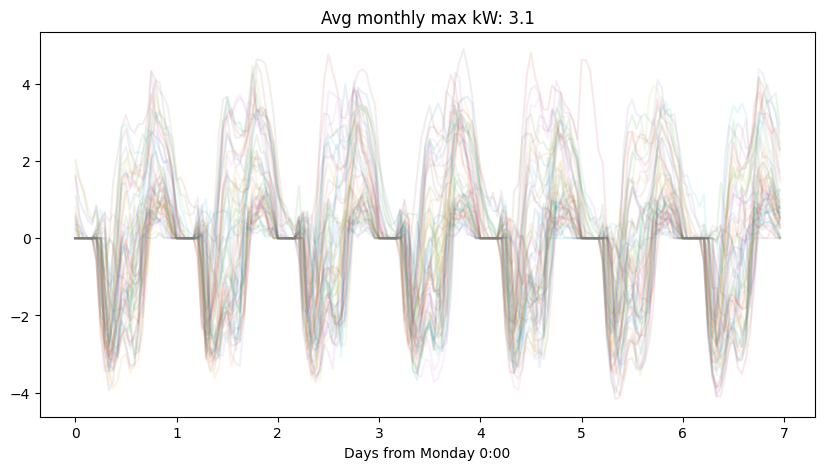

In [116]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Monthly peaks

## Single TOU

In [117]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

angle = 'w20'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90 reduction',peaks['netload_s20->s20w90 reduc kw'].mean())
peaks

Avg w20 reduction 0.20833333333333334
Avg w90 reduction 0.17499999999999996
Avg s20w90 reduction 0.17499999999999996


,netload_s20 kw,netload_s20 t,netload_w20 kw,netload_w20 t,netload_s20->w20 reduc kw,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90 kw,netload_s20w90 t,netload_s20->s20w90 reduc kw
1,0.6,2022-01-20 08:00:00,0.6,2022-01-20 08:00:00,0.0,0.6,2022-01-22 10:00:00,0.0,0.6,2022-01-20 09:00:00,0.0
2,0.5,2022-02-08 08:00:00,0.5,2022-02-08 08:00:00,0.0,0.5,2022-02-08 08:00:00,0.0,0.5,2022-02-08 08:00:00,0.0
3,0.3,2022-03-09 08:00:00,0.3,2022-03-09 08:00:00,0.0,0.4,2022-03-09 08:00:00,-0.1,0.3,2022-03-09 08:00:00,0.0
4,0.6,2022-04-13 08:00:00,0.6,2022-04-13 08:00:00,0.0,0.6,2022-04-13 08:00:00,0.0,0.6,2022-04-13 08:00:00,0.0
5,0.7,2022-05-17 08:00:00,0.7,2022-05-17 08:00:00,0.0,0.8,2022-05-17 08:00:00,-0.1,0.7,2022-05-17 08:00:00,0.0
6,2.4,2022-06-28 10:00:00,2.4,2022-06-28 10:00:00,0.0,2.9,2022-06-28 10:00:00,-0.5,2.6,2022-06-28 10:00:00,-0.2
7,2.3,2022-07-31 10:00:00,1.6,2022-07-31 10:00:00,0.7,1.7,2022-07-12 10:00:00,0.6,1.5,2022-07-31 10:00:00,0.8
8,3.5,2022-08-24 10:00:00,2.8,2022-08-26 10:00:00,0.7,2.1,2022-08-26 10:00:00,1.4,2.8,2022-08-26 10:00:00,0.7
9,3.2,2022-09-03 10:00:00,2.5,2022-09-08 10:00:00,0.7,2.7,2022-09-09 10:00:00,0.5,2.6,2022-09-09 10:00:00,0.6
10,0.8,2022-10-01 10:00:00,0.3,2022-10-30 09:00:00,0.5,0.3,2022-10-30 09:00:00,0.5,0.4,2022-10-01 10:00:00,0.4


## Variable TOU

w20

In [118]:
angle1 = 's20'
angle2 = 'w20'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
7,8,17,0.9,0.3,0.0
8,8,18,1.3,0.3,0.0
18,9,17,0.9,0.3,0.0
19,9,18,1.3,0.3,0.0
28,10,17,0.9,0.3,0.0
29,10,18,1.3,0.3,0.0
37,11,17,0.9,0.3,0.0
38,11,18,1.3,0.3,0.0
45,12,17,0.9,0.3,0.0
46,12,18,1.3,0.3,0.0


w90

In [119]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
52,13,17,1.1,0.4,-0.1
53,13,18,1.5,0.4,-0.1
58,14,17,1.1,0.4,-0.1
59,14,18,1.5,0.4,-0.1
63,15,17,1.3,0.4,-0.1
64,15,18,1.5,0.4,0.0
68,16,18,1.5,0.4,0.0


s20w90

In [120]:
angle1 = 's20'
angle2 = 's20w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
8,8,18,1.3,0.3,-0.1
19,9,18,1.3,0.3,-0.1
29,10,18,1.3,0.3,-0.1
38,11,18,1.3,0.3,-0.1
46,12,18,1.3,0.3,-0.1
52,13,17,0.8,0.3,-0.1
53,13,18,1.3,0.3,-0.1
58,14,17,0.8,0.3,-0.1
59,14,18,1.3,0.3,-0.1
63,15,17,0.9,0.3,0.0


Best for w90

In [121]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [122]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [123]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak shaving

## Technical

More or less technical peak shaving doesn't benefit from bifacial, I think because if you're trying to shave the entire day you benefit more from the greater kWh produced by s20 than any of the other angles.

### Single angle

In [124]:
angle = 's20'
threshold = 6
batt_kwh_max = 50
tou_h = list(range(24))

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {tou_h[0]}-{tou_h[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 6.0, Battery kWh = 2.0,


### Several angles

In [125]:
threshold = 6
batt_kwh_max = 70
TOU_hours = list(range(24))

results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            TOU_hours)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 6.0, Battery kWh = 2.0,
Solution found: netload_w20, Threshold kw = 6.0, Battery kWh = 2.0,
Solution found: netload_w90, Threshold kw = 6.0, Battery kWh = 2.0,
Solution found: netload_s20w90, Threshold kw = 6.0, Battery kWh = 2.0,


,batt_kwh,dispatch
s20,2,load solar_s20 solar_...
w20,2,load solar_s20 solar_...
w90,2,load solar_s20 solar_...
s20w90,2,load solar_s20 solar_...


s20

In [126]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [127]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

## Economic

### Single angle

In [129]:
threshold = 0
batt_kwh_max = 1500
angle = 's20'
tou_h = list(range(16,21))

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 1307.0,


### Several angles

In [130]:
threshold = 0
batt_kwh_max = 1500
TOU_hours = list(range(16,21))

results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            TOU_hours)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 1307.0,
Solution found: netload_w20, Threshold kw = 0.0, Battery kWh = 1329.0,
Solution found: netload_w90, Threshold kw = 0.0, Battery kWh = 570.0,
Solution found: netload_s20w90, Threshold kw = 0.0, Battery kWh = 957.0,


,batt_kwh,dispatch
s20,1307,load solar_s20 solar_...
w20,1329,load solar_s20 solar_...
w90,570,load solar_s20 solar_...
s20w90,957,load solar_s20 solar_...


s20

In [131]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [132]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')